#Initialization: Imports & Time Management

In [1]:
!pip install lorem
!pip install tiktoken
!pip install torch torchvision
!pip install tensorboard
#!pip install plotly

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3 -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3 -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3 -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3 -m pip install --upgrade pip


In [2]:
import sys
import site

# Add the user site-packages directory to the Python path
site.addsitedir('/tf/.local/lib/python3.11/site-packages')

#import time
#startTime = time.time()

import lorem
import tiktoken

from keras.datasets import mnist
from keras.utils import to_categorical

import colorsys
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import random

import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import tensorboard
from torch import nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Subset

import ipywidgets as widgets
from IPython.display import display, clear_output

import os
import json
import requests
import tensorflow as tf
from tqdm import tqdm

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)

import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = 'colab'

#for including tensorboard
writer = SummaryWriter()

2024-06-22 13:18:42.889884: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-22 13:18:42.922151: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-22 13:18:42.922191: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-22 13:18:42.922219: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-22 13:18:42.928992: I tensorflow/core/platform/cpu_feature_g

cpu


In [3]:
# !git clone "https://github.com/luca-g97/Interactive-AI-Playground.git"

# !mv /content/Interactive-AI-Playground/* /content/
# !rm -rf /content/Interactive-AI-Playground/
# !rm /content/README.md

#Initialization: Datasets

**MNIST: Number Classification**

In [4]:
import Images_MNIST as MNIST
MNIST.initializePackages(mnist, to_categorical, nn, DataLoader, device, writer)
trainSetMNIST, testSetMNIST = MNIST.createTrainAndTestSet()

Created 60000 Trainsamples & 10000 Testsamples


**HSV -> RGB Conversion**

In [5]:
import Images_HSVRGB as HSVRGB
HSVRGB.initializePackages(colorsys, go, pio, DataLoader, device, writer)
trainSetHSVRGB, testSetHSVRGB = HSVRGB.createTrainAndTestSet(50000, 10000, visualize=False)

Created 50653 Trainsamples & 10000 Testsamples


**Small 1x1: LLM-Sourcecheck**

In [6]:
import LLM_Small1x1 as Small1x1
Small1x1.initializePackages(random, lorem, device, tiktoken, DataLoader, writer)
small1x1 = Small1x1.createTrainAndTestSet(100)

Created 100 samples for Small1x1


#Initialization

In [7]:
datasets = {
    "MNIST": (trainSetMNIST, testSetMNIST),
    "HSV-RGB": (trainSetHSVRGB, testSetHSVRGB),
    #"Cifar10": (trainSetCIFAR10, testSetCIFAR10),
    "Small 1x1": (small1x1[:90], small1x1[90:])
}

In [8]:
import Widgets
Widgets.initialize(trainSetMNIST, testSetMNIST, datasets)

# Selection Initialization

In [19]:
LLM_Layers, TransformerBlockLayer = Small1x1.setGPTSettings(Widgets.layerAmountChoice.value, Widgets.learningRateChoice.value, Widgets.epochsChoice.value)

datasetChoice = Widgets.datasetChoice.value
#datasetChoice = "HSV-RGB"

if(datasetChoice == "MNIST"):
    chosenDataSet = MNIST
elif(datasetChoice == "HSV-RGB"):
    chosenDataSet = HSVRGB
elif(datasetChoice == "Small 1x1"):
    chosenDataSet = Small1x1

seed = ""
if (Widgets.seedChoice.value != "Random"):
    seed = Widgets.seedChoice.value
    torch.manual_seed(seed)
    np.random.seed(seed)

if(datasetChoice == "Small 1x1"):
    hidden_sizes = []
    hidden_sizes.append(LLM_Layers[0])
    for _ in range(Widgets.layerAmountChoice.value):
        hidden_sizes.append(TransformerBlockLayer)
    hidden_sizes.append(LLM_Layers[1])
    hidden_sizes = [item for sublist in hidden_sizes for item in sublist]

else:
    hidden_sizes = [(normalLayer.value, normalLayerSize.value, activationLayer.value) for normalLayer, normalLayerSize, activationLayer in zip(Widgets.normalLayerChoice, Widgets.normalLayerSizeChoice, Widgets.activationLayerChoice)]
    hidden_sizes.append((Widgets.outputLayerChoice.value, 10, Widgets.outputActivationLayerChoice.value))

visualizeCustom = [((normalLayer.value[0], normalLayer.value[1]), activationLayer.value) for normalLayer, activationLayer in zip(Widgets.neuronChoice, Widgets.activationLayerTypeChoice)]
visualizeCustom.append(((Widgets.outputLayerSizeChoice.value[0], Widgets.outputLayerSizeChoice.value[1]), Widgets.outputLayerActivationChoiceType.value))

epochs = Widgets.epochsChoice.value
learning_rate = Widgets.learningRateChoice.value
train_samples = Widgets.trainSamplesChoice.value
test_samples = Widgets.testSamplesChoice.value
batch_size_training = Widgets.batchSizeTraining.value
batch_size_test = Widgets.batchSizeTest.value
loss_function = Widgets.lossChoice.value
optimizer = Widgets.optimizerChoice.value
eval_samples = Widgets.evalSamplesChoice.value

closestSources = Widgets.closestSourcesChoice.value
showClosestMostUsedSources = Widgets.showClosestMostUsedSourcesChoice.value
visualizationChoice = Widgets.visualizationChoice.value

In [20]:
import Customizable_RENN as RENN
RENN.initializePackages(device, seed)

# Training

In [21]:
chosenDataSet.initializeDatasets(train_samples, test_samples, eval_samples, batch_size_training, batch_size_test, seed)
chosenDataSet.trainModel(hidden_sizes, loss_function, optimizer, learning_rate, epochs)
#tensorboard --logdir="/content/runs"

Epoch 1, Train Loss: 0.16371232271194458, Validation Loss: 0.18549253046512604
Epoch 2, Train Loss: 0.14714394509792328, Validation Loss: 0.16418619453907013
Epoch 3, Train Loss: 0.1329265683889389, Validation Loss: 0.14630873501300812
Epoch 4, Train Loss: 0.12107491493225098, Validation Loss: 0.13108395040035248
Epoch 5, Train Loss: 0.11151225119829178, Validation Loss: 0.11847130209207535
Epoch 6, Train Loss: 0.10423189401626587, Validation Loss: 0.10876735299825668
Epoch 7, Train Loss: 0.0984281376004219, Validation Loss: 0.10186616331338882
Epoch 8, Train Loss: 0.09397199749946594, Validation Loss: 0.09822452813386917
Epoch 9, Train Loss: 0.09086787700653076, Validation Loss: 0.09756170958280563
Epoch 10, Train Loss: 0.08905434608459473, Validation Loss: 0.0992274284362793


# Sourcecheck Customisable RENN

In [22]:
chosenDataSet.initializeHook(hidden_sizes, train_samples)

Initializing Hooks
Hook-Dictionaries created
Hooks finished successfully


# Visualization Customisable RENN

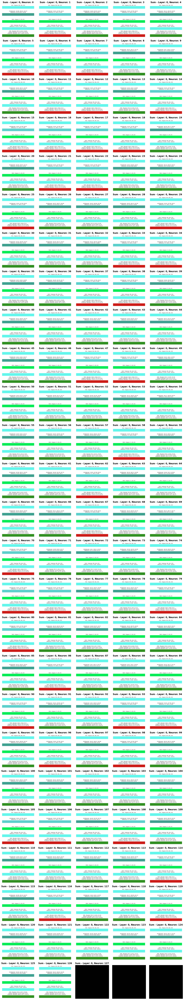

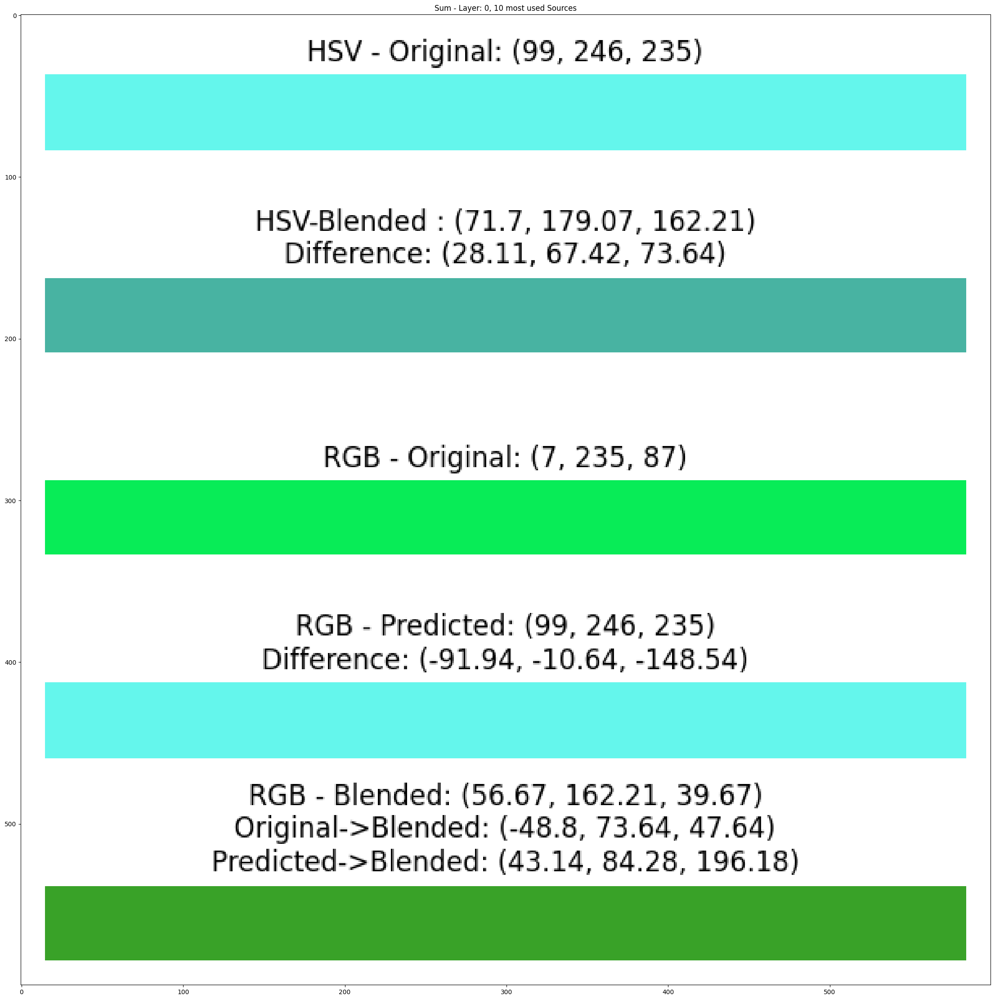

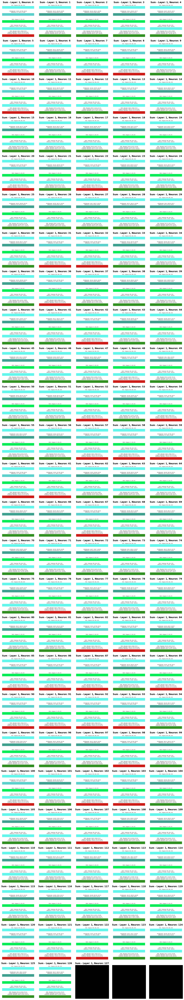

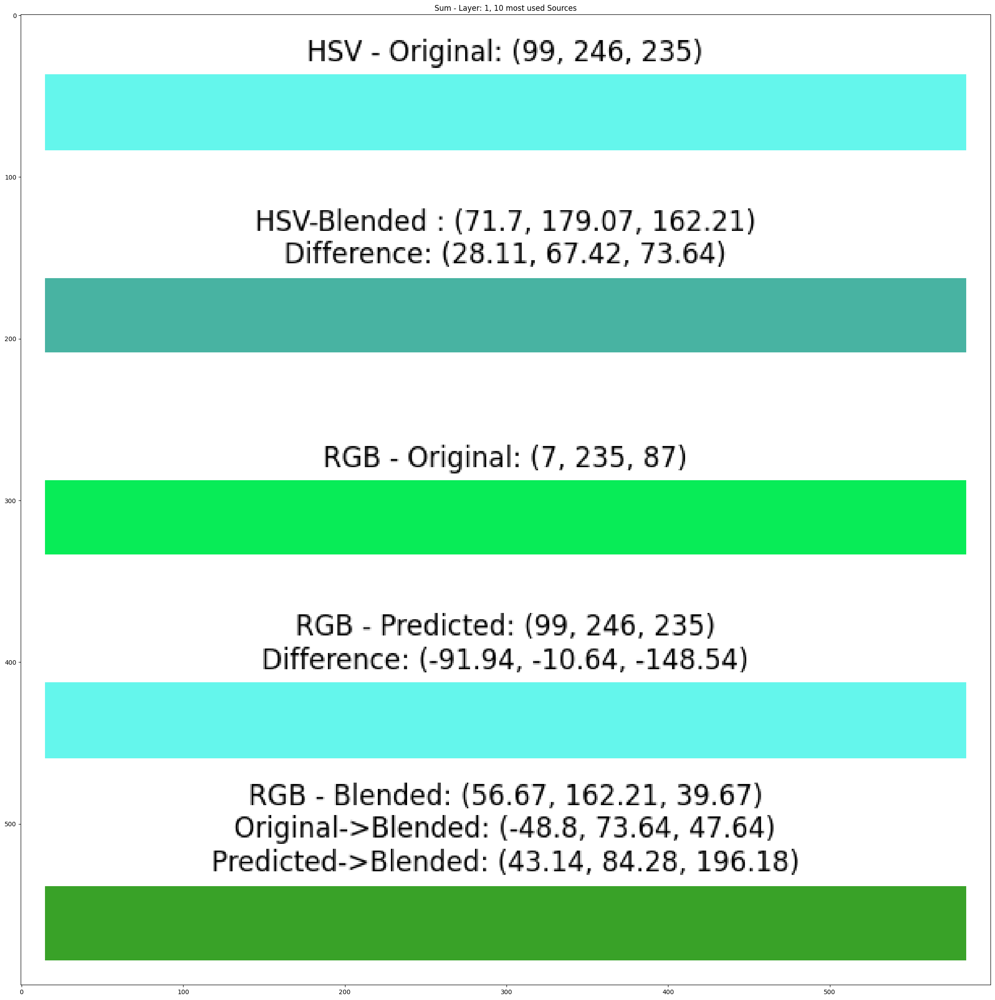

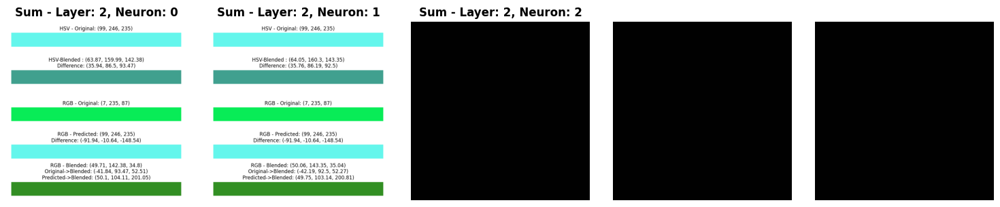

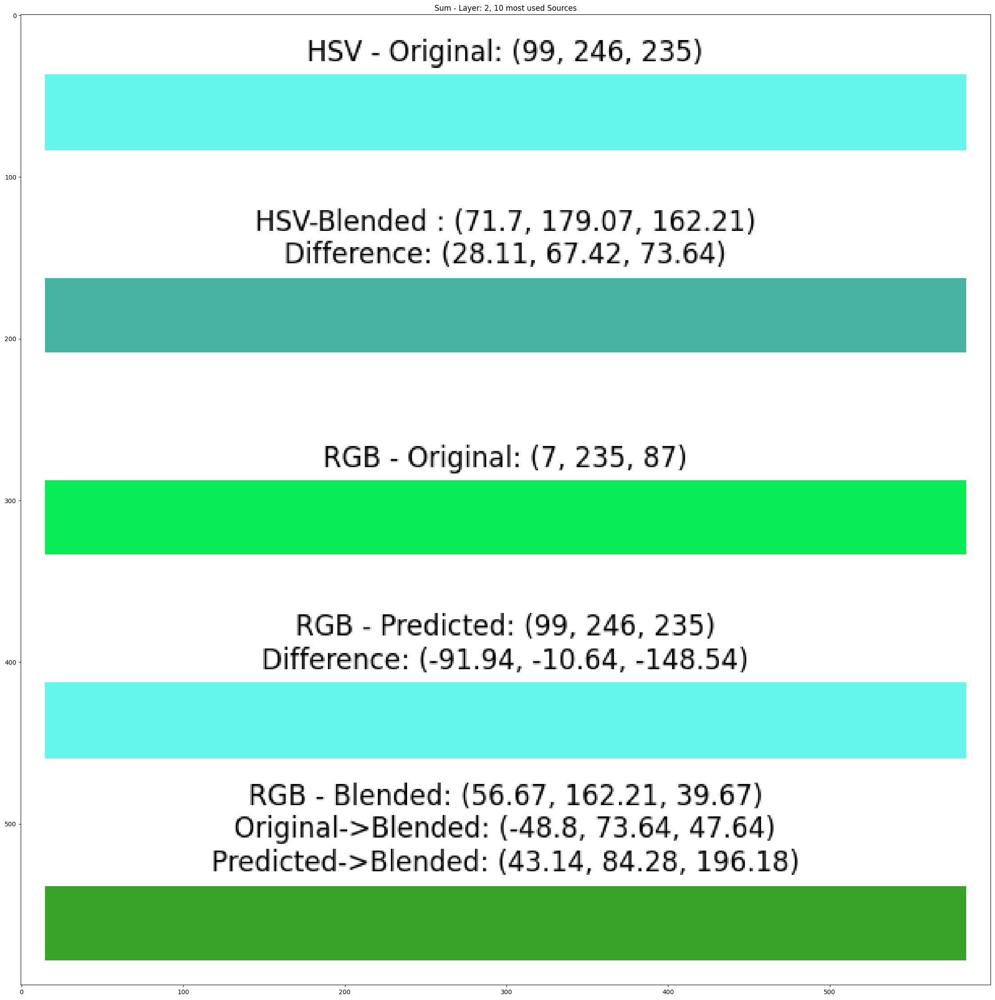

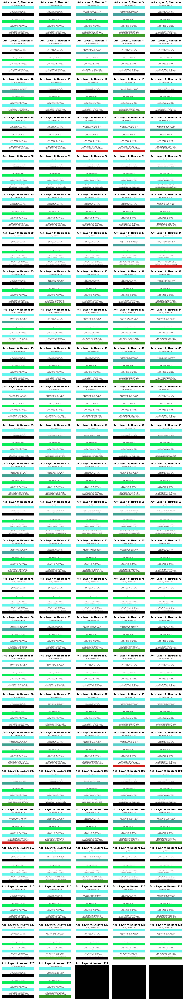

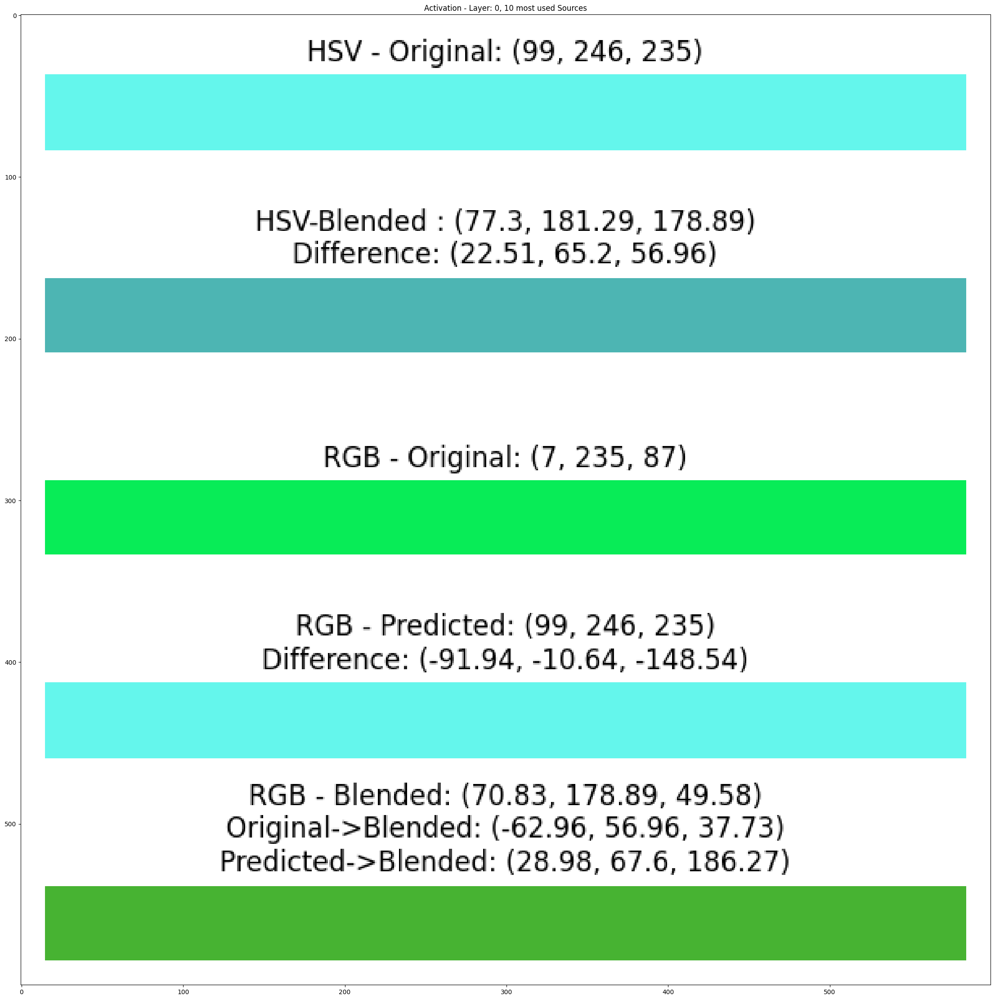

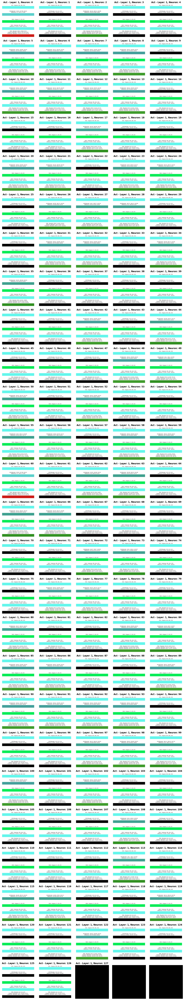

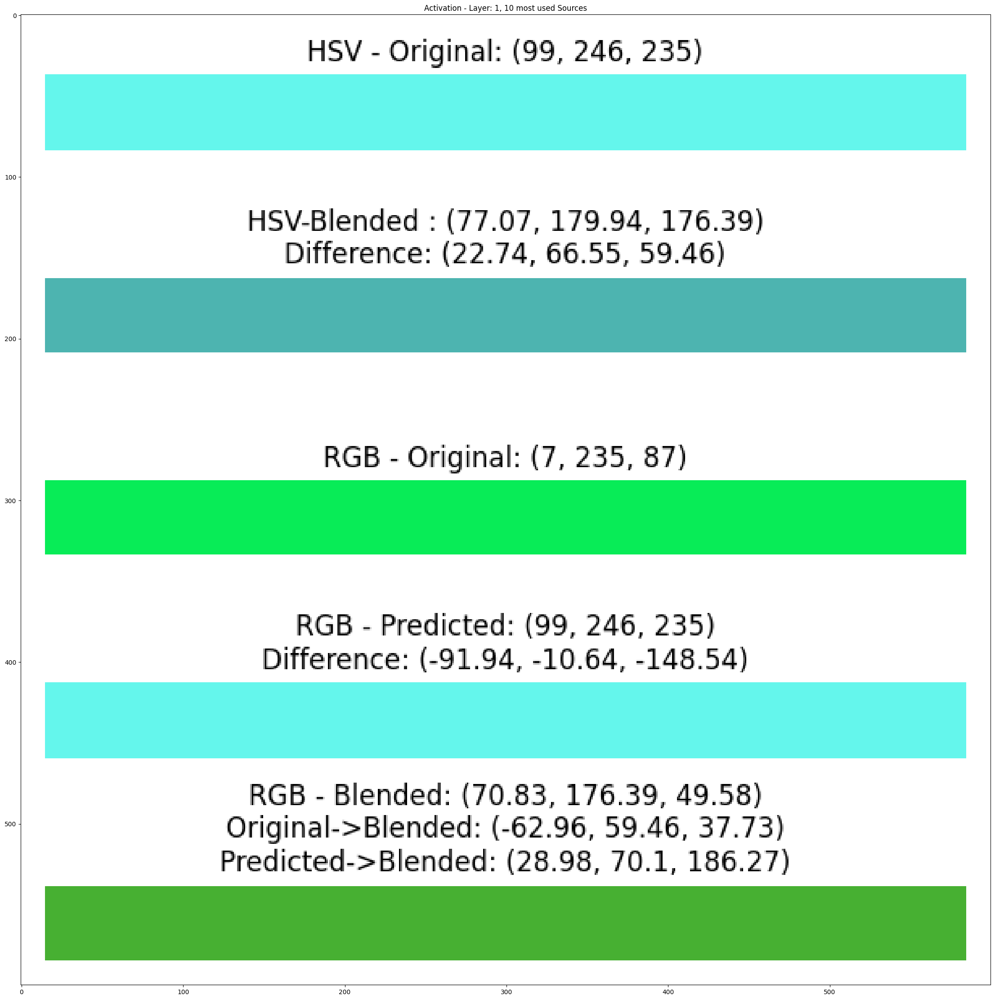

In [23]:
chosenDataSet.visualize(hidden_sizes, closestSources, showClosestMostUsedSources, visualizationChoice)

**Only for HSV-RGB conversion: The visualization cell (cell above) must be run before, otherwise there will nothing be displayed!**

In [29]:
# @title Click `Show code` in the code cell. { display-mode: "form" }

if(datasetChoice == "HSV-RGB"):
    layerChoiceSlider = Widgets.createIntSlider(value=0, min=0, max=len(hidden_sizes)-1, description="Layer")
    neuronChoiceSlider = Widgets.createIntSlider(value=0, min=0, max=hidden_sizes[layerChoiceSlider.value][1]-1, description="Neuron")

    def update_sliders(*args):
        neuronChoiceSlider.max = hidden_sizes[layerChoiceSlider.value][1]-1
        clear_output(wait=True)
        display(layerChoiceSlider, neuronChoiceSlider)

    layerChoiceSlider.observe(update_sliders, names='value')
    neuronChoiceSlider.observe(update_sliders, names='value')

    display(layerChoiceSlider, neuronChoiceSlider)

IntSlider(value=0, continuous_update=False, description='Layer', layout=Layout(width='95%'), max=2, style=Slid…

IntSlider(value=115, continuous_update=False, description='Neuron', layout=Layout(width='95%'), max=127, style…

**Only for HSV-RGB conversion: Pick the layer and neuron you want to be displayed, then run the cell below to display it**

In [30]:
# @title Click `Show code` in the code cell. { display-mode: "form" }

if(datasetChoice == "HSV-RGB"):
    def update_visualization(*args):
        clear_output(wait=True)
        chosenDataSet.visualize3DCube(closestSources, layerChoiceSlider.value, neuronChoiceSlider.value, hidden_sizes[layerChoiceSlider.value][1]-1)

    layerChoiceSlider.observe(update_visualization, names='value')
    neuronChoiceSlider.observe(update_visualization, names='value')

    update_visualization()